In [1]:
import numpy as np # library to handle data in a vectorized manner

import pandas as pd # library for data analsysis
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

import json # library to handle JSON files

#!conda install -c conda-forge geopy --yes # uncomment this line if you haven't completed the Foursquare API lab
from geopy.geocoders import Nominatim # convert an address into latitude and longitude values

import requests # library to handle requests
from pandas.io.json import json_normalize # tranform JSON file into a pandas dataframe

# Matplotlib and associated plotting modules
import matplotlib.cm as cm
import matplotlib.colors as colors

# import k-means from clustering stage
from sklearn.cluster import KMeans

#!conda install -c conda-forge folium=0.5.0 --yes # uncomment this line if you haven't completed the Foursquare API lab
import folium # map rendering library

print('Libraries imported.')

Libraries imported.


# Introduction

Utah is one of the nation’s great outdoor states with incredible national parks, such as Arches National Park, Zion National Park, etc. Utah is also well known of its world famous ski area, such as Snowbird, Park City Mountain Resort, etc. Since there are millions of travelers coming to Utah each year for its incredible national parks and ski resorts, opening a business targeting travelers will be a good idea. However, since these beautiful nature attractions are all over the place in Utah, researches on existing common venues near each attraction are necessary. Therefore, this study aims to utilize Foursquare website to find out the most common and popular existing venues near the Utah national and state parks. Additionally, the population of Utah Counties are collected to study whether there’s a relationship between the choices of venues and the location of the attractions.

# Data used in this study

1. A list of Utah National and State Parks
2. A list of geograpical coordinates of each National and State Parks
3. Foursqaure location data showing common venues near National and State Parks
4. A list of Utah County names and its population
5. GeoJson file details the Utah county boundaries

# Make Choropleth Plot of UT Counties with Populations

In [207]:
state_geo = r"D:/Udemy_Learning/Python IBM/Capstone/ut-county-boundaries.geojson"
state_population = r"D:/Udemy_Learning/Python IBM/Capstone/UT_population_counties.csv"
state_data = pd.read_csv(state_population)
state_data['Population'].astype(int)
state_data.head()

,County,Population
0,Utah County,605490
1,Wasatch County,31708
2,Uintah County,36084
3,Salt Lake County,1133646
4,Iron County,51213


In [208]:
import json 
policejson = json.load(open(r"D:/Udemy_Learning/Python IBM/Capstone/ut-county-boundaries.geojson")) 
for x in policejson['features'] : 
    print (x['properties']['namelsad']) 

Utah County
Wasatch County
Uintah County
Salt Lake County
Iron County
Rich County
Beaver County
Juab County
Daggett County
Wayne County
Carbon County
Davis County
Kane County
Garfield County
San Juan County
Box Elder County
Sanpete County
Weber County
Summit County
Tooele County
Morgan County
Duchesne County
Piute County
Grand County
Millard County
Cache County
Sevier County
Emery County
Washington County


In [209]:
UTcounties_map = folium.Map(location=[39.4225192, -111.714358], zoom_start=6)

bins = list(state_data["Population"].quantile([0, 0.25, 0.5, 0.75, 0.8, 0.9, 0.95, 1]))

folium.Choropleth(
    geo_data=state_geo,
    name="choropleth",
    data=state_data,
    columns=['County','Population'],
    key_on="feature.properties.namelsad",
    #threshold_scale=[1000, 20000, 30000, 50000, 100000, 500000],
    fill_color="BuPu",
    fill_opacity=0.7,
    line_opacity=0.5,
    #legend_name="Population",
    bins=bins,
    reset=True
).add_to(UTcounties_map)

folium.LayerControl().add_to(UTcounties_map)

UTcounties_map

# Create Plots of UT Parks

In [2]:
UT_National_parks = ['Arches National Park', 'Bryce Canyon', 
                     'Canyonlands National Parks', 'Capitol Reef National Park', 
                     'Cedar Breaks National Monument', 'Glen Canyon', 
                     'Natural Bridges National Monument', 'Timpanogos Cave',
                     'Zion National Park']

In [3]:
import pandas as pd
import numpy as np
import requests
from bs4 import BeautifulSoup

url = 'https://en.wikipedia.org/wiki/List_of_Utah_State_Parks'
r = requests.get(url)
soup = BeautifulSoup(r.text, 'html.parser')
table = soup.find('table')
dfs = pd.read_html(str(table).replace("2;", "2"))

In [4]:
UT_State_parks = []

for row in soup.find("tbody").find_all("tr"):
    #for row2 in row.find_all('td'):
        #print(row2.text)
    r = row.find_all('td')
    if len(r)>1:
        UT_State_parks.append(str(r[0]).split('title')[1].split('"')[2].split("<")[0][1:])

In [5]:
UT_parks = UT_National_parks + UT_State_parks
UT_parks.remove('Camp Floyd / Stagecoach Inn State Park and Museum')
UT_parks.remove('Historic Union Pacific Rail Trail State Park')
UT_parks.remove('Jordan River Off-Highway Vehicle State Recreation Area')
UT_parks.remove('Echo State Park')
UT_parks.remove('Rockport State Park')

In [6]:
UT_parks

['Arches National Park',
 'Bryce Canyon',
 'Canyonlands National Parks',
 'Capitol Reef National Park',
 'Cedar Breaks National Monument',
 'Glen Canyon',
 'Natural Bridges National Monument',
 'Timpanogos Cave',
 'Zion National Park',
 'Anasazi State Park Museum',
 'Antelope Island State Park',
 'Bear Lake State Park',
 'Coral Pink Sand Dunes State Park',
 'Dead Horse Point State Park',
 'Deer Creek State Park',
 'East Canyon State Park',
 'Edge of the Cedars State Park Museum',
 'Escalante Petrified Forest State Park',
 'Flight Park State Recreation Area',
 'Fremont Indian State Park and Museum',
 'Frontier Homestead State Park Museum',
 'Goblin Valley State Park',
 'Goosenecks State Park',
 'Great Salt Lake State Park',
 'Green River State Park',
 'Gunlock State Park',
 'Huntington State Park',
 'Hyrum State Park',
 'Jordanelle State Park',
 'Kodachrome Basin State Park',
 'Millsite State Park',
 'Otter Creek State Park',
 'Palisade State Park',
 'Piute State Park',
 'Quail Creek St

In [7]:
print('There are {} places in UT.'.format(len(UT_parks)))

There are 48 places in UT.


In [8]:
#address = 'Zions national park'
latitude = []
longitude = []

for i in UT_parks:
    geolocator = Nominatim(user_agent="ny_explorer")
    location = geolocator.geocode(i)
    lat = location.latitude
    lon = location.longitude
    latitude.append(lat)
    longitude.append(lon)
    print('The geograpical coordinate of {} are {}, {}.'.format(i, lat, lon))
print('Finished generating geograpical coordinates.')

The geograpical coordinate of Arches National Park are 38.7315573, -109.56302781715105.
The geograpical coordinate of Bryce Canyon are 37.618409, -112.1422341.
The geograpical coordinate of Canyonlands National Parks are 38.347889, -109.85835058828671.
The geograpical coordinate of Capitol Reef National Park are 38.06702855, -111.15525624854631.
The geograpical coordinate of Cedar Breaks National Monument are 37.642638500000004, -112.84472310706003.
The geograpical coordinate of Glen Canyon are 36.8796091, -111.5342184.
The geograpical coordinate of Natural Bridges National Monument are 37.6025953, -110.01118054267647.
The geograpical coordinate of Timpanogos Cave are 40.4382447, -111.70942702074615.
The geograpical coordinate of Zion National Park are 37.320774, -113.00484758652519.
The geograpical coordinate of Anasazi State Park Museum are 37.9108608, -111.4236185.
The geograpical coordinate of Antelope Island State Park are 40.94851905, -112.20962930311691.
The geograpical coordina

In [9]:
map_utah = folium.Map(location = [39.4225192, -111.714358],zoom_start = 6)

for lat, lon, park in zip(latitude, longitude, UT_parks):
    label = '{}'.format(park)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
         [lat, lon],
         radius=5,
         popup=label,
         color='blue',
         fill=True,
         fill_color='#3186cc',
         fill_opacity=0.7,
         parse_html=False).add_to(map_utah)
map_utah

In [10]:
d = {'Parks':UT_parks, 'latitude':latitude, 'longitude':longitude}
df = pd.DataFrame(d)

In [11]:
df.head()

,Parks,latitude,longitude
0,Arches National Park,38.731557,-109.563028
1,Bryce Canyon,37.618409,-112.142234
2,Canyonlands National Parks,38.347889,-109.858351
3,Capitol Reef National Park,38.067029,-111.155256
4,Cedar Breaks National Monument,37.642639,-112.844723


In [12]:
CLIENT_ID = 'AS542Z4N5FCL1DZFL0YJH4PPPH1OHSVEGB0TJ2WEBYXIHX4N' # your Foursquare ID
CLIENT_SECRET = 'WA4MBFE1EUOSZLMG5FM2ELSZKTJKICDYPVHB0KSBSIKKB1WX' # your Foursquare Secret
VERSION = '20180605' # Foursquare API version
LIMIT = 100 # A default Foursquare API limit value

print('Your credentails:')
print('CLIENT_ID: ' + CLIENT_ID)
print('CLIENT_SECRET:' + CLIENT_SECRET)

Your credentails:
CLIENT_ID: AS542Z4N5FCL1DZFL0YJH4PPPH1OHSVEGB0TJ2WEBYXIHX4N
CLIENT_SECRET:WA4MBFE1EUOSZLMG5FM2ELSZKTJKICDYPVHB0KSBSIKKB1WX


In [67]:
def getNearbyVenues(names, latitudes, longitudes, radius=100000):
    
    venues_list=[]
    for name, lat, lng in zip(names, latitudes, longitudes):
        print(name)
            
        # create the API request URL
        url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION, 
            lat, 
            lng, 
            radius, 
            LIMIT)
            
        # make the GET request
        results = requests.get(url).json()["response"]['groups'][0]['items']
        
        # return only relevant information for each nearby venue
        venues_list.append([(
            name, 
            lat, 
            lng, 
            v['venue']['name'], 
            v['venue']['location']['lat'], 
            v['venue']['location']['lng'],  
            v['venue']['categories'][0]['name']) for v in results])

    nearby_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
    nearby_venues.columns = ['Neighborhood', 
                  'Neighborhood Latitude', 
                  'Neighborhood Longitude', 
                  'Venue', 
                  'Venue Latitude', 
                  'Venue Longitude', 
                  'Venue Category']
    
    return(nearby_venues)

In [68]:
df.describe()

,latitude,longitude
count,48.000000,48.000000
mean,39.026712,-111.516375
std,1.467642,1.169607
min,36.879609,-113.768241
25%,37.639844,-112.200165
50%,38.849607,-111.641235
75%,40.459391,-110.888894
max,41.846048,-109.428076


In [69]:
UT_parks_venues = getNearbyVenues(names=df['Parks'],
                                   latitudes=df['latitude'],
                                   longitudes=df['longitude'])

Arches National Park
Bryce Canyon
Canyonlands National Parks
Capitol Reef National Park
Cedar Breaks National Monument
Glen Canyon
Natural Bridges National Monument
Timpanogos Cave
Zion National Park
Anasazi State Park Museum
Antelope Island State Park
Bear Lake State Park
Coral Pink Sand Dunes State Park
Dead Horse Point State Park
Deer Creek State Park
East Canyon State Park
Edge of the Cedars State Park Museum
Escalante Petrified Forest State Park
Flight Park State Recreation Area
Fremont Indian State Park and Museum
Frontier Homestead State Park Museum
Goblin Valley State Park
Goosenecks State Park
Great Salt Lake State Park
Green River State Park
Gunlock State Park
Huntington State Park
Hyrum State Park
Jordanelle State Park
Kodachrome Basin State Park
Millsite State Park
Otter Creek State Park
Palisade State Park
Piute State Park
Quail Creek State Park
Red Fleet State Park
Sand Hollow State Park
Scofield State Park
Snow Canyon State Park
Starvation State Park
Steinaker State Park

In [70]:
UT_parks_venues.groupby('Neighborhood').count()

,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
Neighborhood,,,,,,
Anasazi State Park Museum,100,100,100,100,100,100
Antelope Island State Park,100,100,100,100,100,100
Arches National Park,100,100,100,100,100,100
Bear Lake State Park,100,100,100,100,100,100
Bryce Canyon,100,100,100,100,100,100
Canyonlands National Parks,100,100,100,100,100,100
Capitol Reef National Park,85,85,85,85,85,85
Cedar Breaks National Monument,100,100,100,100,100,100
Coral Pink Sand Dunes State Park,100,100,100,100,100,100


In [71]:
print('There are {} uniques categories.'.format(len(UT_parks_venues['Venue Category'].unique())))

There are 164 uniques categories.


In [72]:
# one hot encoding
UTparks_onehot = pd.get_dummies(UT_parks_venues[['Venue Category']], prefix="", prefix_sep="")

# add neighborhood column back to dataframe
UTparks_onehot['Neighborhood'] = UT_parks_venues['Neighborhood'] 

# move neighborhood column to the first column
fixed_columns = [UTparks_onehot.columns[-1]] + list(UTparks_onehot.columns[:-1])
UTparks_onehot = UTparks_onehot[fixed_columns]

UTparks_onehot.head()

,Neighborhood,Airport,American Restaurant,Amphitheater,Andhra Restaurant,Arcade,Art Gallery,Asian Restaurant,Athletics & Sports,BBQ Joint,Bagel Shop,Bakery,Bank,Bar,Baseball Field,Beach,Bed & Breakfast,Beer Bar,Belgian Restaurant,Big Box Store,Bistro,Bookstore,Border Crossing,Bowling Alley,Boxing Gym,Brazilian Restaurant,Breakfast Spot,Brewery,Burger Joint,Cafeteria,Café,Campground,Cheese Shop,Chinese Restaurant,Clothing Store,Cocktail Bar,Coffee Shop,Comedy Club,Comfort Food Restaurant,Convenience Store,Cosmetics Shop,Creperie,Dam,Deli / Bodega,Dessert Shop,Diner,Discount Store,Distillery,Dog Run,Donut Shop,Exhibit,Farm,Fast Food Restaurant,Food,Food Court,Food Service,Food Stand,Food Truck,Forest,Fried Chicken Joint,Frozen Yogurt Shop,Fruit & Vegetable Store,Furniture / Home Store,Garden,Gas Station,Gastropub,German Restaurant,Gift Shop,Golf Course,Golf Driving Range,Greek Restaurant,Grocery Store,Gym,Gym / Fitness Center,Harbor / Marina,Hardware Store,Hawaiian Restaurant,Historic Site,History Museum,Hobby Shop,Hot Dog Joint,Hot Spring,Hotel,Hotel Bar,Ice Cream Shop,Indian Restaurant,Intersection,Italian Restaurant,Japanese Restaurant,Juice Bar,Lake,Liquor Store,Market,Martial Arts School,Mediterranean Restaurant,Mexican Restaurant,Middle Eastern Restaurant,Monument / Landmark,Motel,Motorcycle Shop,Mountain,Movie Theater,Moving Target,Multiplex,Museum,Music Venue,National Park,New American Restaurant,Organic Grocery,Other Great Outdoors,Outdoor Supply Store,Paper / Office Supplies Store,Park,Performing Arts Venue,Peruvian Restaurant,Pet Store,Pharmacy,Pizza Place,Plaza,Poke Place,Post Office,RV Park,Ramen Restaurant,Recreation Center,Resort,Rest Area,Restaurant,Rock Climbing Spot,Sandwich Place,Scenic Lookout,Seafood Restaurant,Shipping Store,Shopping Mall,Skating Rink,Ski Area,Ski Lodge,Soccer Stadium,Soup Place,Spa,Speakeasy,Sporting Goods Shop,State / Provincial Park,Steakhouse,Supermarket,Sushi Restaurant,Taco Place,Tex-Mex Restaurant,Thai Restaurant,Theater,Theme Park Ride / Attraction,Tourist Information Center,Toy / Game Store,Trail,Train Station,Travel & Transport,Truck Stop,Vegetarian / Vegan Restaurant,Video Game Store,Vietnamese Restaurant,Warehouse Store,Water Park,Whisky Bar,Wings Joint,Zoo,Zoo Exhibit
0,Arches National Park,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,Arches National Park,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,Arches National Park,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0
3,Arches National Park,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0
4,Arches National Park,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,

In [73]:
UTparks_onehot.shape

(4426, 165)

In [74]:
UTparks_grouped = UTparks_onehot.groupby('Neighborhood').mean().reset_index()
UTparks_grouped

,Neighborhood,Airport,American Restaurant,Amphitheater,Andhra Restaurant,Arcade,Art Gallery,Asian Restaurant,Athletics & Sports,BBQ Joint,Bagel Shop,Bakery,Bank,Bar,Baseball Field,Beach,Bed & Breakfast,Beer Bar,Belgian Restaurant,Big Box Store,Bistro,Bookstore,Border Crossing,Bowling Alley,Boxing Gym,Brazilian Restaurant,Breakfast Spot,Brewery,Burger Joint,Cafeteria,Café,Campground,Cheese Shop,Chinese Restaurant,Clothing Store,Cocktail Bar,Coffee Shop,Comedy Club,Comfort Food Restaurant,Convenience Store,Cosmetics Shop,Creperie,Dam,Deli / Bodega,Dessert Shop,Diner,Discount Store,Distillery,Dog Run,Donut Shop,Exhibit,Farm,Fast Food Restaurant,Food,Food Court,Food Service,Food Stand,Food Truck,Forest,Fried Chicken Joint,Frozen Yogurt Shop,Fruit & Vegetable Store,Furniture / Home Store,Garden,Gas Station,Gastropub,German Restaurant,Gift Shop,Golf Course,Golf Driving Range,Greek Restaurant,Grocery Store,Gym,Gym / Fitness Center,Harbor / Marina,Hardware Store,Hawaiian Restaurant,Historic Site,History Museum,Hobby Shop,Hot Dog Joint,Hot Spring,Hotel,Hotel Bar,Ice Cream Shop,Indian Restaurant,Intersection,Italian Restaurant,Japanese Restaurant,Juice Bar,Lake,Liquor Store,Market,Martial Arts School,Mediterranean Restaurant,Mexican Restaurant,Middle Eastern Restaurant,Monument / Landmark,Motel,Motorcycle Shop,Mountain,Movie Theater,Moving Target,Multiplex,Museum,Music Venue,National Park,New American Restaurant,Organic Grocery,Other Great Outdoors,Outdoor Supply Store,Paper / Office Supplies Store,Park,Performing Arts Venue,Peruvian Restaurant,Pet Store,Pharmacy,Pizza Place,Plaza,Poke Place,Post Office,RV Park,Ramen Restaurant,Recreation Center,Resort,Rest Area,Restaurant,Rock Climbing Spot,Sandwich Place,Scenic Lookout,Seafood Restaurant,Shipping Store,Shopping Mall,Skating Rink,Ski Area,Ski Lodge,Soccer Stadium,Soup Place,Spa,Speakeasy,Sporting Goods Shop,State / Provincial Park,Steakhouse,Supermarket,Sushi Restaurant,Taco Place,Tex-Mex Restaurant,Thai Restaurant,Theater,Theme Park Ride / Attraction,Tourist Information Center,Toy / Game Store,Trail,Train Station,Travel & Transport,Truck Stop,Vegetarian / Vegan Restaurant,Video Game Store,Vietnamese Restaurant,Warehouse Store,Water Park,Whisky Bar,Wings Joint,Zoo,Zoo Exhibit
0,Anasazi State Park Museum,0.000000,0.080000,0.00,0.00,0.00,0.00,0.000000,0.00,0.010000,0.00,0.000000,0.000000,0.000000,0.000000,0.010000,0.020000,0.00,0.00,0.000000,0.000000,0.00,0.000000,0.00,0.00,0.00,0.010000,0.000000,0.010000,0.000000,0.010000,0.030000,0.00,0.000000,0.00,0.00,0.020000,0.00,0.00,0.000000,0.00,0.00,0.000000,0.000000,0.00,0.020000,0.010000,0.00,0.00,0.00,0.000000,0.00,0.000000,0.01,0.010000,0.00,0.000000,0.00,0.010000,0.000000,0.00,0.00,0.00,0.00,0.010000,0.000000,0.00,0.010000,0.000000,0.00,0.00,0.010000,0.000000,0.00,0.000000,0.000000,0.00,0.000000,0.000000,0.00,0.00,0.000000,0.080000,0.000000,0.000000,0.010000,0.000000,0.000000,0.00,0.00,0.000000,0.000000,0.00,0.00,0.00,0.010000,0.00,0.000000,0.060000,0.00,0.000000,0.010000,0.000000,0.00,0.010000,0.00,0.070000,0.010000,0.00,0.010000,0.00,0.00,0.000000,0.00,0.00,0.00,0.000000,0.030000,0.000000,0.00,0.010000,0.020000,0.00,0.00,0.020000,0.000000,0.010000,0.000000,0.020000,0.130000,0.00,0.010000,0.00,0.00,0.010000,0.000000,0.00,0.00,0.000000,0.00,0.010000,0.020000,0.020000,0.00,0.000000,0.000000,0.00,0.00,0.00,0.00,0.030000,0.00,0.100000,0.000000,0.000000,0.000000,0.00,0.000000,0.00,0.000000,0.00,0.00,0.000000,0.000000,0.00
1,Antelope Island State Park,0.000000,0.020000,0.01,0.00,0.00,0.00,0.010000,0.00,0.010000,0.01,0.060000,0.000000,0.030000,0.000000,0.000000,0.000000,0.01,0.01,0.000000,0.000000,0.02,0.000000,0.00,0.00,0.00,0.020000,0.020000,0.020000,0.000000,0.000000,0.000000,0.00,0.000000,0.00,0.02,0.050000,0.01,0.00,0.000000,0.00,0.00,0.000000,0.010000,0.00,0.020000,0.000000,0.00,0.00,0.01,0.000000,0.00,0.020000,0.00,0.000000,0.00,0.000000,0.00,0.000000,0.000000,0.00,0.00,0.00,0.01,0.000000,0.010000,0.01,0.000000,0.000000,0.00,0.01,0.050000

In [75]:
UTparks_grouped.shape

(48, 165)

In [76]:
num_top_venues = 5

for hood in UTparks_grouped['Neighborhood']:
    print("----"+hood+"----")
    temp = UTparks_grouped[UTparks_grouped['Neighborhood'] == hood].T.reset_index()
    temp.columns = ['venue','freq']
    temp = temp.iloc[1:]
    temp['freq'] = temp['freq'].astype(float)
    temp = temp.round({'freq': 2})
    print(temp.sort_values('freq', ascending=False).reset_index(drop=True).head(num_top_venues))
    print('\n')

----Anasazi State Park Museum----
                 venue  freq
0       Scenic Lookout  0.13
1                Trail  0.10
2  American Restaurant  0.08
3                Hotel  0.08
4        National Park  0.07


----Antelope Island State Park----
                venue  freq
0              Bakery  0.06
1                Park  0.05
2         Coffee Shop  0.05
3       Grocery Store  0.05
4  Mexican Restaurant  0.04


----Arches National Park----
                        venue  freq
0              Scenic Lookout  0.17
1                       Trail  0.11
2         American Restaurant  0.05
3  Tourist Information Center  0.04
4               National Park  0.04


----Bear Lake State Park----
                 venue  freq
0   Mexican Restaurant  0.08
1          Coffee Shop  0.08
2  American Restaurant  0.08
3          Pizza Place  0.05
4         Burger Joint  0.05


----Bryce Canyon----
                 venue  freq
0       Scenic Lookout  0.16
1                Trail  0.11
2  American Restaurant  0

In [77]:
def return_most_common_venues(row, num_top_venues):
    row_categories = row.iloc[1:]
    row_categories_sorted = row_categories.sort_values(ascending=False)
    
    return row_categories_sorted.index.values[0:num_top_venues]

In [78]:
num_top_venues = 10

indicators = ['st', 'nd', 'rd']

# create columns according to number of top venues
columns = ['Neighborhood']
for ind in np.arange(num_top_venues):
    try:
        columns.append('{}{} Most Common Venue'.format(ind+1, indicators[ind]))
    except:
        columns.append('{}th Most Common Venue'.format(ind+1))

# create a new dataframe
neighborhoods_venues_sorted = pd.DataFrame(columns=columns)
neighborhoods_venues_sorted['Neighborhood'] = UTparks_grouped['Neighborhood']

for ind in np.arange(UTparks_grouped.shape[0]):
    neighborhoods_venues_sorted.iloc[ind, 1:] = return_most_common_venues(UTparks_grouped.iloc[ind, :], num_top_venues)

neighborhoods_venues_sorted.head()

,Neighborhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,Anasazi State Park Museum,Scenic Lookout,Trail,Hotel,American Restaurant,National Park,Motel,Tourist Information Center,Pizza Place,Campground,Resort
1,Antelope Island State Park,Bakery,Park,Grocery Store,Coffee Shop,Mexican Restaurant,Pizza Place,Bar,Hotel,Breakfast Spot,Steakhouse
2,Arches National Park,Scenic Lookout,Trail,American Restaurant,National Park,Tourist Information Center,Hotel,Mexican Restaurant,Café,Park,Pizza Place
3,Bear Lake State Park,Mexican Restaurant,American Restaurant,Coffee Shop,Grocery Store,Burger Joint,Pizza Place,Bakery,Fast Food Restaurant,Breakfast Spot,Indian Restaurant
4,Bryce Canyon,Scenic Lookout,Trail,American Restaurant,Hotel,National Park,Resort,Coffee Shop,Campground,Pizza Place,Mexican Restaurant


In [79]:
# set number of clusters
kclusters = 5

UTparks_grouped_clustering = UTparks_grouped.drop('Neighborhood', 1)

# run k-means clustering
kmeans = KMeans(n_clusters=kclusters, random_state=0).fit(UTparks_grouped_clustering)

# check cluster labels generated for each row in the dataframe
kmeans.labels_[0:10] 

array([1, 4, 1, 4, 1, 1, 1, 1, 3, 1])

In [80]:
# add clustering labels
neighborhoods_venues_sorted.insert(0, 'Cluster Labels', kmeans.labels_)


In [81]:
UTparks_merged = df

# merge manhattan_grouped with manhattan_data to add latitude/longitude for each neighborhood
UTparks_merged = UTparks_merged.join(neighborhoods_venues_sorted.set_index('Neighborhood'), on='Parks')

UTparks_merged.head() # check the last columns!

,Parks,latitude,longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,Arches National Park,38.731557,-109.563028,1,Scenic Lookout,Trail,American Restaurant,National Park,Tourist Information Center,Hotel,Mexican Restaurant,Café,Park,Pizza Place
1,Bryce Canyon,37.618409,-112.142234,1,Scenic Lookout,Trail,American Restaurant,Hotel,National Park,Resort,Coffee Shop,Campground,Pizza Place,Mexican Restaurant
2,Canyonlands National Parks,38.347889,-109.858351,1,Scenic Lookout,Trail,American Restaurant,Rest Area,National Park,Hotel,Café,Campground,Breakfast Spot,Tourist Information Center
3,Capitol Reef National Park,38.067029,-111.155256,1,Trail,Scenic Lookout,Hotel,American Restaurant,National Park,Motel,RV Park,Pizza Place,Grocery Store,State / Provincial Park
4,Cedar Breaks National Monument,37.642639,-112.844723,1,Scenic Lookout,Trail,Hotel,American Restaurant,National Park,Resort,Mexican Restaurant,Campground,Pizza Place,Coffee Shop


In [82]:
# create map
map_clusters = folium.Map(location=[39.4225192, -111.714358], zoom_start=6)

# set color scheme for the clusters
x = np.arange(kclusters)
ys = [i + x + (i*x)**2 for i in range(kclusters)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

# add markers to the map
markers_colors = []
for lat, lon, poi, cluster in zip(UTparks_merged['latitude'], UTparks_merged['longitude'], UTparks_merged['Parks'], UTparks_merged['Cluster Labels']):
    label = folium.Popup(str(poi) + ' Cluster ' + str(cluster), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup=label,
        color=rainbow[cluster-1],
        fill=True,
        fill_color=rainbow[cluster-1],
        fill_opacity=0.7).add_to(map_clusters)
       
map_clusters

In [280]:
C0 = UTparks_merged.loc[UTparks_merged['Cluster Labels'] == 0, UTparks_merged.columns[[0] + list(range(4, UTparks_merged.shape[1]))]]
C0

,Parks,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
7,Timpanogos Cave,Ski Area,Park,Ski Lodge,Fast Food Restaurant,Grocery Store,Bakery,Coffee Shop,Mexican Restaurant,Gym,Pizza Place
14,Deer Creek State Park,Ski Area,Park,American Restaurant,Ski Lodge,Café,Mexican Restaurant,Grocery Store,Fast Food Restaurant,Coffee Shop,Bakery
18,Flight Park State Recreation Area,Park,Coffee Shop,Ski Area,Grocery Store,Fast Food Restaurant,Sporting Goods Shop,Mexican Restaurant,Bar,Pizza Place,Bakery
28,Jordanelle State Park,Ski Area,Park,Ski Lodge,Mexican Restaurant,Coffee Shop,Grocery Store,Hotel,American Restaurant,Café,New American Restaurant
37,Scofield State Park,Ski Area,Grocery Store,Fast Food Restaurant,Bakery,Park,Pizza Place,American Restaurant,Ice Cream Shop,Scenic Lookout,Mexican Restaurant
44,Utah Lake State Park,Ski Area,Fast Food Restaurant,Hotel,Ski Lodge,Coffee Shop,Park,Gym,Pizza Place,Warehouse Store,Mexican Restaurant
45,Wasatch Mountain State Park,Ski Area,Park,Ski Lodge,Mexican Restaurant,Fast Food Restaurant,Café,Bakery,Hotel,Grocery Store,Coffee Shop


In [281]:
C1 = UTparks_merged.loc[UTparks_merged['Cluster Labels'] == 1, UTparks_merged.columns[[0] + list(range(4, UTparks_merged.shape[1]))]]
C1

,Parks,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,Arches National Park,Scenic Lookout,Trail,American Restaurant,National Park,Tourist Information Center,Hotel,Mexican Restaurant,Café,Park,Pizza Place
1,Bryce Canyon,Scenic Lookout,Trail,American Restaurant,Hotel,National Park,Resort,Coffee Shop,Campground,Pizza Place,Mexican Restaurant
2,Canyonlands National Parks,Scenic Lookout,Trail,American Restaurant,Rest Area,National Park,Hotel,Café,Campground,Breakfast Spot,Tourist Information Center
3,Capitol Reef National Park,Trail,Scenic Lookout,Hotel,American Restaurant,National Park,Motel,RV Park,Pizza Place,Grocery Store,State / Provincial Park
4,Cedar Breaks National Monument,Scenic Lookout,Trail,Hotel,American Restaurant,National Park,Resort,Mexican Restaurant,Campground,Pizza Place,Coffee Shop
5,Glen Canyon,Scenic Lookout,National Park,Hotel,Trail,American Restaurant,Fast Food Restaurant,Restaurant,Coffee Shop,Harbor / Marina,Beach
6,Natural Bridges National Monument,Scenic Lookout,National Park,Hotel,Gas Station,Motel,Tourist Information Center,Steakhouse,Mountain,Sandwich Place,Café
9,Anasazi State Park Museum,Scenic Lookout,Trail,Hotel,American Restaurant,National Park,Motel,Tourist Information Center,Pizza Place,Campground,Resort
13,Dead Horse Point State Park,Scenic Lookout,Trail,American Restaurant,Rest Area,National Park,Hotel,Café,Campground,Breakfast Spot,Tourist Information Center
16,Edge of the Cedars State Park Museum,Scenic Lookout,National Park,Hotel,Tourist Information Center,Plaza,American Restaurant,Border Crossing,Steakhouse,Mexican Restaurant,Rest Area


In [282]:
C2 = UTparks_merged.loc[UTparks_merged['Cluster Labels'] == 2, UTparks_merged.columns[[0] + list(range(4, UTparks_merged.shape[1]))]]
C2

,Parks,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
19,Fremont Indian State Park and Museum,American Restaurant,Hotel,Gas Station,Sandwich Place,Motel,Steakhouse,Mexican Restaurant,Scenic Lookout,National Park,Convenience Store
22,Goosenecks State Park,Hotel,National Park,Motel,Scenic Lookout,Gas Station,Convenience Store,Plaza,Steakhouse,Sandwich Place,Diner
26,Huntington State Park,Gas Station,Fast Food Restaurant,American Restaurant,Scenic Lookout,Sandwich Place,Hotel,Breakfast Spot,Pizza Place,Big Box Store,Ice Cream Shop
30,Millsite State Park,Sandwich Place,American Restaurant,Gas Station,Scenic Lookout,Pizza Place,Hotel,Fast Food Restaurant,Breakfast Spot,Mexican Restaurant,Coffee Shop
32,Palisade State Park,Gas Station,American Restaurant,Fast Food Restaurant,Pizza Place,Scenic Lookout,Sandwich Place,Hotel,Coffee Shop,Breakfast Spot,Ice Cream Shop
35,Red Fleet State Park,Gas Station,Sandwich Place,Campground,Pizza Place,National Park,Fast Food Restaurant,Convenience Store,Hotel,Grocery Store,Discount Store
39,Starvation State Park,Sandwich Place,Fast Food Restaurant,Pizza Place,Grocery Store,Gas Station,Convenience Store,Hotel,Scenic Lookout,Ski Lodge,Mexican Restaurant
40,Steinaker State Park,Gas Station,Sandwich Place,Hotel,National Park,Convenience Store,Pizza Place,Fast Food Restaurant,Campground,Tourist Information Center,Post Office
42,Territorial Statehouse State Park Museum,Gas Station,Sandwich Place,Hotel,American Restaurant,Fast Food Restaurant,Discount Store,Convenience Store,Pizza Place,Café,Taco Place
43,Utah Field House of Natural History State Park...,Gas Station,Sandwich Place,Hotel,National Park,Convenience Store,Pizza Place,Fast Food Restaurant,Campground,Tourist Information Center,Post Office


In [283]:
C3 = UTparks_merged.loc[UTparks_merged['Cluster Labels'] == 3, UTparks_merged.columns[[0] + list(range(4, UTparks_merged.shape[1]))]]
C3

,Parks,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
8,Zion National Park,Trail,American Restaurant,Hotel,Café,Scenic Lookout,Resort,Mexican Restaurant,Pizza Place,National Park,Coffee Shop
12,Coral Pink Sand Dunes State Park,Hotel,Trail,Scenic Lookout,American Restaurant,National Park,Resort,Gift Shop,Café,Tourist Information Center,Grocery Store
20,Frontier Homestead State Park Museum,Trail,Scenic Lookout,Hotel,National Park,Mexican Restaurant,Coffee Shop,Resort,Theater,Pizza Place,American Restaurant
25,Gunlock State Park,Trail,Hotel,American Restaurant,Golf Course,Coffee Shop,Mexican Restaurant,Scenic Lookout,Grocery Store,Sandwich Place,Café
34,Quail Creek State Park,Hotel,Trail,American Restaurant,Coffee Shop,Mexican Restaurant,Pizza Place,Breakfast Spot,Resort,Golf Course,National Park
36,Sand Hollow State Park,Hotel,Trail,American Restaurant,Mexican Restaurant,Coffee Shop,Breakfast Spot,Resort,Golf Course,National Park,Scenic Lookout
38,Snow Canyon State Park,Hotel,Trail,Coffee Shop,American Restaurant,Golf Course,Scenic Lookout,Mexican Restaurant,Grocery Store,Breakfast Spot,Café


In [284]:
C4= UTparks_merged.loc[UTparks_merged['Cluster Labels'] == 4, UTparks_merged.columns[[0] + list(range(4, UTparks_merged.shape[1]))]]
C4

,Parks,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
10,Antelope Island State Park,Bakery,Park,Grocery Store,Coffee Shop,Mexican Restaurant,Pizza Place,Bar,Hotel,Breakfast Spot,Steakhouse
11,Bear Lake State Park,Mexican Restaurant,American Restaurant,Coffee Shop,Grocery Store,Burger Joint,Pizza Place,Bakery,Fast Food Restaurant,Breakfast Spot,Indian Restaurant
15,East Canyon State Park,Ski Area,Coffee Shop,Grocery Store,Bakery,Mexican Restaurant,Hotel,Park,Café,American Restaurant,Shopping Mall
23,Great Salt Lake State Park,Coffee Shop,Mexican Restaurant,Grocery Store,Bar,Park,Bakery,Brewery,Hotel,Burger Joint,Gym
27,Hyrum State Park,American Restaurant,Pizza Place,Bakery,Coffee Shop,Mexican Restaurant,Fast Food Restaurant,Park,Burger Joint,Grocery Store,Breakfast Spot
41,This Is the Place Heritage Park,Mexican Restaurant,Coffee Shop,Grocery Store,Park,Bakery,Bar,Brewery,Burger Joint,New American Restaurant,Mediterranean Restaurant
46,Willard Bay State Park,Bakery,American Restaurant,Pizza Place,Mexican Restaurant,Coffee Shop,Park,Breakfast Spot,Grocery Store,Fast Food Restaurant,Burger Joint


In [210]:
# set color scheme for the clusters
x = np.arange(kclusters)
ys = [i + x + (i*x)**2 for i in range(kclusters)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

# add markers to the map
markers_colors = []
for lat, lon, poi, cluster in zip(UTparks_merged['latitude'], UTparks_merged['longitude'], UTparks_merged['Parks'], UTparks_merged['Cluster Labels']):
    label = folium.Popup(str(poi) + ' Cluster ' + str(cluster), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup=label,
        color=rainbow[cluster-1],
        fill=True,
        fill_color=rainbow[cluster-1],
        fill_opacity=0.7).add_to(UTcounties_map)
       
UTcounties_map

https://public.opendatasoft.com/explore/dataset/us-county-boundaries/export/?disjunctive.statefp&disjunctive.countyfp&disjunctive.name&disjunctive.namelsad&disjunctive.stusab&disjunctive.state_name&refine.state_name=Utah&sort=name

https://www.utah-demographics.com/counties_by_population

In [520]:
LC0 =[*C0.iloc[:,1],*C0.iloc[:,2],*C0.iloc[:,3],*C0.iloc[:,4],*C0.iloc[:,5]]
LC0 = [x for x in LC0 if (x != 'Ski Area') and (x != 'Park')]
LC0= pd.DataFrame(pd.Series(LC0).value_counts(normalize=True)[0:5],columns=['Percentage'])
LC0['Cluster']=[0,0,0,0,0]
LC0['Density']=[5,5,5,5,5]
LC0.reset_index(inplace=True)
LC0.rename(columns = {'index' : 'Venues'},inplace=True)
LC0

,Venues,Percentage,Cluster,Density
0,Ski Lodge,0.227273,0,5
1,Fast Food Restaurant,0.227273,0,5
2,Grocery Store,0.136364,0,5
3,Coffee Shop,0.136364,0,5
4,Mexican Restaurant,0.090909,0,5


In [541]:
LC1 =[*C1.iloc[:,1],*C1.iloc[:,2],*C1.iloc[:,3],*C1.iloc[:,4],*C1.iloc[:,5]]
LC1 = [x for x in LC1 if (x != 'Scenic Lookout') and (x != 'Trail') and (x != 'National Park') and (x != 'Tourist Information Center')]
LC1= pd.DataFrame(pd.Series(LC1).value_counts(normalize=True)[0:5],columns=['Percentage'])
LC1['Cluster']=[1,1,1,1,1]
LC1['Density']=[1,1,1,1,1]
LC1.reset_index(inplace=True)
LC1.rename(columns = {'index' : 'Venues'},inplace=True)
LC1

,Venues,Percentage,Cluster,Density
0,American Restaurant,0.424242,1,1
1,Hotel,0.363636,1,1
2,Rest Area,0.090909,1,1
3,Motel,0.030303,1,1
4,Gas Station,0.030303,1,1


In [522]:
LC2 =[*C2.iloc[:,1],*C2.iloc[:,2],*C2.iloc[:,3],*C2.iloc[:,4],*C2.iloc[:,5]]
LC2 = [x for x in LC2 if (x != 'National Park')]
LC2= pd.DataFrame(pd.Series(LC2).value_counts(normalize=True)[0:5],columns=['Percentage'])
LC2['Cluster']=[2,2,2,2,2]
LC2['Density']=[2,2,2,2,2]
LC2.reset_index(inplace=True)
LC2.rename(columns = {'index' : 'Venues'},inplace=True)
LC2

,Venues,Percentage,Cluster,Density
0,Gas Station,0.215686,2,2
1,Sandwich Place,0.176471,2,2
2,American Restaurant,0.117647,2,2
3,Fast Food Restaurant,0.098039,2,2
4,Pizza Place,0.098039,2,2


In [523]:
LC3 =[*C3.iloc[:,1],*C3.iloc[:,2],*C3.iloc[:,3],*C3.iloc[:,4],*C3.iloc[:,5]]
LC3 = [x for x in LC3 if (x != 'Trail') and (x != 'Scenic Lookout')and (x != 'National Park')]
LC3= pd.DataFrame(pd.Series(LC3).value_counts(normalize=True)[0:5],columns=['Percentage'])
LC3['Cluster']=[3,3,3,3,3]
LC3['Density']=[3,3,3,3,3]
LC3.reset_index(inplace=True)
LC3.rename(columns = {'index' : 'Venues'},inplace=True)
LC3

,Venues,Percentage,Cluster,Density
0,Hotel,0.304348,3,3
1,American Restaurant,0.260870,3,3
2,Coffee Shop,0.173913,3,3
3,Mexican Restaurant,0.130435,3,3
4,Golf Course,0.086957,3,3


In [524]:
LC4 =[*C4.iloc[:,1],*C4.iloc[:,2],*C4.iloc[:,3],*C4.iloc[:,4],*C4.iloc[:,5]]
LC4= pd.DataFrame(pd.Series(LC4).value_counts(normalize=True)[0:5],columns=['Percentage'])
LC4['Cluster']=[4,4,4,4,4]
LC4['Density']=[4,4,4,4,4]
LC4.reset_index(inplace=True)
LC4.rename(columns = {'index' : 'Venues'},inplace=True)
LC4

,Venues,Percentage,Cluster,Density
0,Mexican Restaurant,0.200000,4,4
1,Coffee Shop,0.200000,4,4
2,Bakery,0.142857,4,4
3,Grocery Store,0.142857,4,4
4,American Restaurant,0.085714,4,4


In [542]:
LC = pd.concat([LC0,LC1,LC2,LC3,LC4])
LC.reset_index(inplace=True)
LC.drop('index',axis=1,inplace=True)
LC

,Venues,Percentage,Cluster,Density
0,Ski Lodge,0.227273,0,5
1,Fast Food Restaurant,0.227273,0,5
2,Grocery Store,0.136364,0,5
3,Coffee Shop,0.136364,0,5
4,Mexican Restaurant,0.090909,0,5
5,American Restaurant,0.424242,1,1
6,Hotel,0.363636,1,1
7,Rest Area,0.090909,1,1
8,Motel,0.030303,1,1
9,Gas Station,0.030303,1,1


In [543]:
LC=LC.sort_values(by=['Percentage'],ascending=False)
LC.reset_index(inplace =True)
LC.drop('index',axis=1,inplace=True)
LC

,Venues,Percentage,Cluster,Density
0,American Restaurant,0.424242,1,1
1,Hotel,0.363636,1,1
2,Hotel,0.304348,3,3
3,American Restaurant,0.260870,3,3
4,Ski Lodge,0.227273,0,5
5,Fast Food Restaurant,0.227273,0,5
6,Gas Station,0.215686,2,2
7,Coffee Shop,0.200000,4,4
8,Mexican Restaurant,0.200000,4,4
9,Sandwich Place,0.176471,2,2


In [527]:
import seaborn as sns
import matplotlib.pylab as plt
%matplotlib inline 

[None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None]

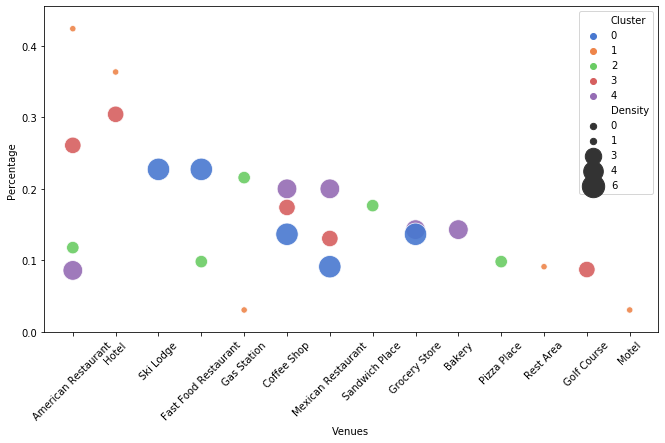

In [547]:
plt.figure(figsize=(11, 6))
plot=sns.scatterplot(data=LC,  x="Venues", y="Percentage",hue='Cluster' ,palette="muted", size="Density",
            sizes=(40, 500), alpha=.9,)
plt.setp(plot.get_xticklabels(), rotation=45)